## Skin Lesion Segmentation ISIC-2018

In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="1"

In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [3]:
from fastai.vision import *
from fastai.callbacks.hooks import *

In [4]:
from fastai.utils.collect_env import *
show_install(True)



```text
=== Software === 
python        : 3.7.0
fastai        : 1.0.57
fastprogress  : 0.1.21
torch         : 1.2.0
nvidia driver : 410.129
torch cuda    : 10.0.130 / is available
torch cudnn   : 7600 / is enabled

=== Hardware === 
nvidia gpus   : 8
torch devices : 1
  - gpu0      : 11178MB | GeForce GTX 1080 Ti

=== Environment === 
platform      : Linux-4.4.0-116-generic-x86_64-with-debian-stretch-sid
distro        : #140-Ubuntu SMP Mon Feb 12 21:23:04 UTC 2018
conda env     : fastai
python        : /vol/muhammed/.conda/envs/fastai/bin/python
sys.path      : /vol/muhammed/course-v3/nbs/segmentation/submit
/vol/muhammed/.conda/envs/fastai/lib/python37.zip
/vol/muhammed/.conda/envs/fastai/lib/python3.7
/vol/muhammed/.conda/envs/fastai/lib/python3.7/lib-dynload

/vol/muhammed/.local/lib/python3.7/site-packages
/vol/muhammed/.conda/envs/fastai/lib/python3.7/site-packages
/vol/muhammed/.conda/envs/fastai/lib/python3.7/site-packages/IPython/extensions
/vol/muhammed/.ipython

Mon Nov 18 

In [4]:
path = Path('/shared/muhammed/segmentation')
path.ls()

[PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1_Training_GroundTruth.zip'),
 PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1_Training_GroundTruth'),
 PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1-2_Training_Input.zip'),
 PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1-2_Training_Input')]

In [5]:
path_lbl = path/'ISIC2018_Task1_Training_GroundTruth'
path_img = path/'ISIC2018_Task1-2_Training_Input'

In [6]:
fnames = get_image_files(path_img)
lbl_names = get_image_files(path_lbl)
fnames[:3], lbl_names[:3]

([PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1-2_Training_Input/ISIC_0012272.jpg'),
  PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1-2_Training_Input/ISIC_0013238.jpg'),
  PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1-2_Training_Input/ISIC_0010360.jpg')],
 [PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1_Training_GroundTruth/ISIC_0000125_segmentation.png'),
  PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1_Training_GroundTruth/ISIC_0012406_segmentation.png'),
  PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1_Training_GroundTruth/ISIC_0001306_segmentation.png')])

In [7]:
len(fnames), len(lbl_names)

(2594, 2594)

In [8]:
get_y_fn = lambda x: path_lbl/f'{x.stem}_segmentation.png'

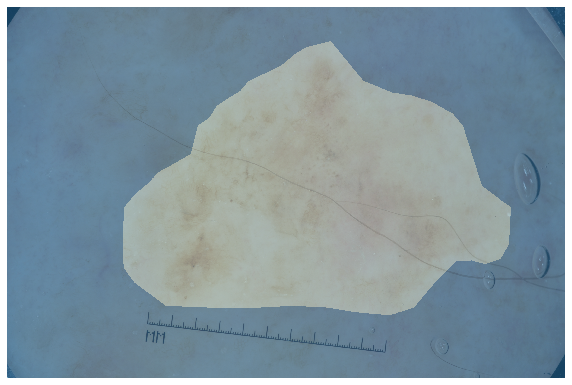

In [12]:
img_f = fnames[-1]
img = open_image(img_f)
mask = open_mask(get_y_fn(img_f), div=True)

fig,ax = plt.subplots(1,1, figsize=(10,10))
img.show(ax=ax)
mask.show(ax=ax, alpha=0.5)

In [13]:
src_size = np.array(mask.shape[1:])
print(src_size)
mask.data

[2848 4288]


tensor([[[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]]])

In [9]:
codes = np.array(['lesion','no-lesion'])

In [10]:
class SegLabelListCustom(SegmentationLabelList):
    def open(self, fn): return open_mask(fn, div=True)
    
class SegItemListCustom(ImageList):
    _label_cls = SegLabelListCustom

In [11]:
src = (SegItemListCustom.from_folder(path_img)
        .split_by_rand_pct(0.2)
        .label_from_func(get_y_fn, classes=codes))

In [12]:
tfms = get_transforms()
data = (src.transform(tfms, size=(256,256), tfm_y=True)
        .databunch(bs=8)
        .normalize(imagenet_stats))

In [13]:
data.valid_ds.items

array([PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1-2_Training_Input/ISIC_0000489.jpg'),
       PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1-2_Training_Input/ISIC_0014975.jpg'),
       PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1-2_Training_Input/ISIC_0009949.jpg'),
       PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1-2_Training_Input/ISIC_0000072.jpg'), ...,
       PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1-2_Training_Input/ISIC_0012105.jpg'),
       PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1-2_Training_Input/ISIC_0013233.jpg'),
       PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1-2_Training_Input/ISIC_0010326.jpg'),
       PosixPath('/shared/muhammed/segmentation/ISIC2018_Task1-2_Training_Input/ISIC_0001286.jpg')], dtype=object)

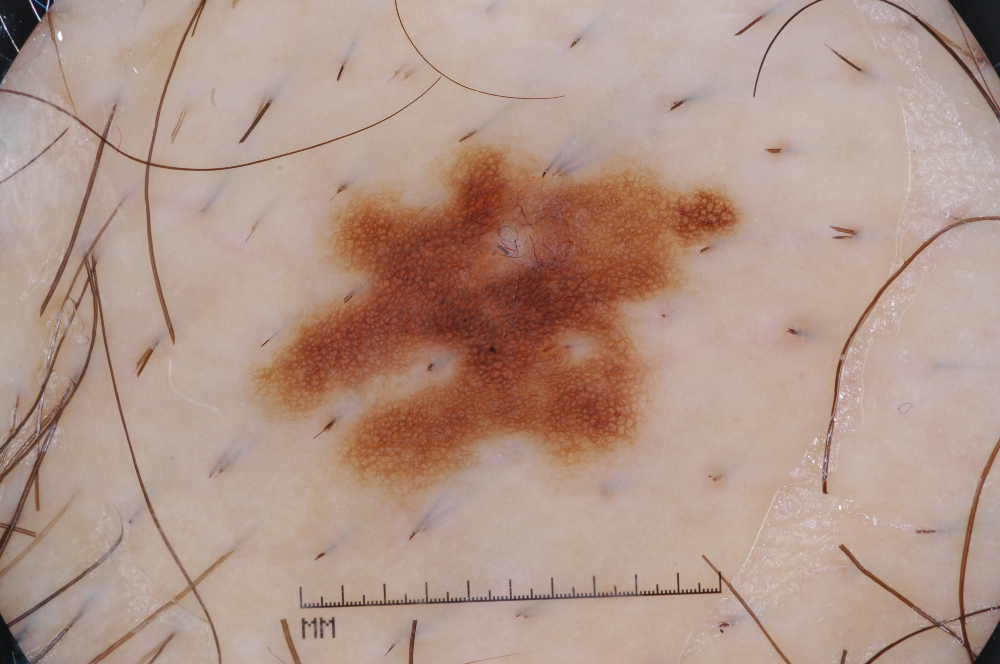

In [17]:
data.train_ds.x[2]

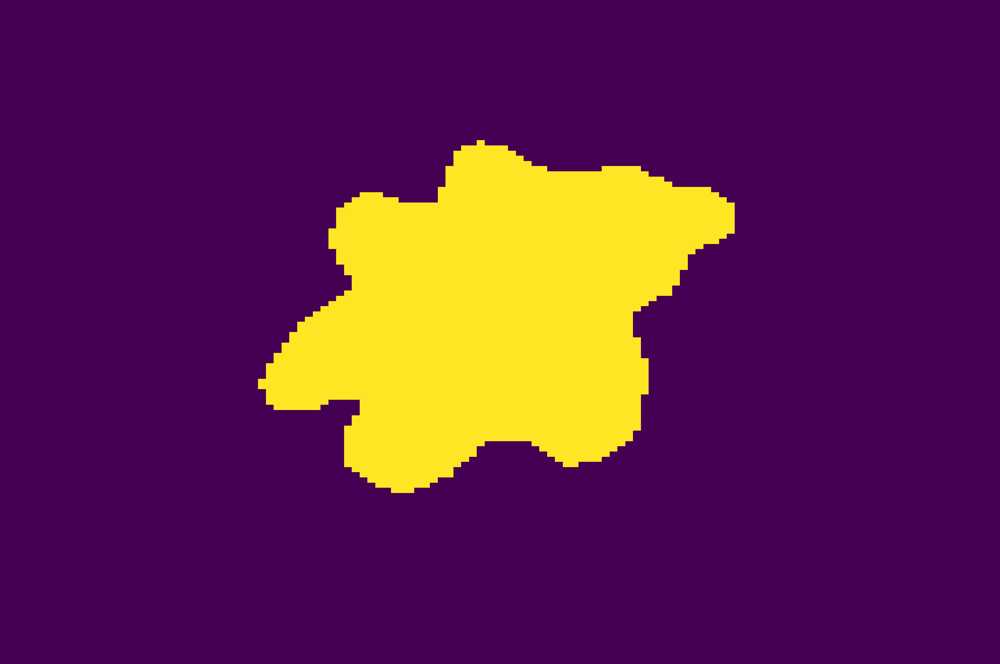

In [18]:
data.train_ds.y[2]

In [19]:
data.train_ds.y[1].data

tensor([[[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]]])

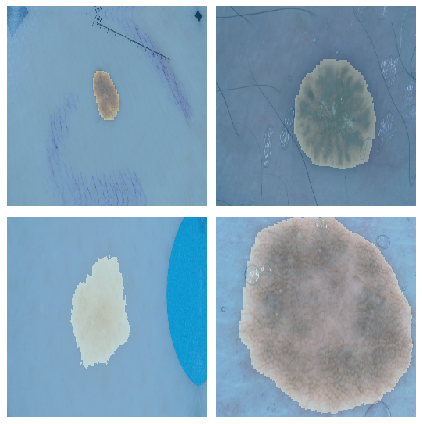

In [17]:
data.show_batch(2,figsize=(6,6))

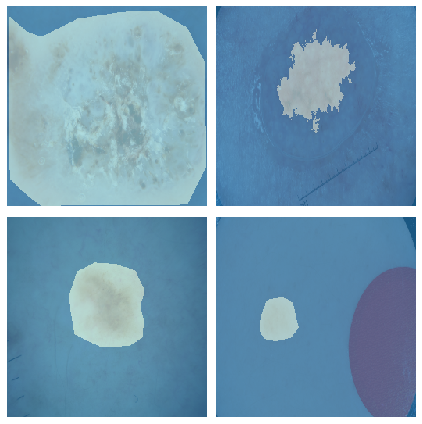

In [21]:
data.show_batch(2,figsize=(6,6), ds_type=DatasetType.Valid, alpha=0.7)

In [18]:
data.classes

array(['lesion', 'no-lesion'], dtype='<U9')

In [14]:
import pdb

In [15]:
def dice_loss(input, target):
#     pdb.set_trace()
    smooth = 1.
    input = input[:,1,None].sigmoid()
    iflat = input.contiguous().view(-1).float()
    tflat = target.view(-1).float()
    intersection = (iflat * tflat).sum()
    return (1 - ((2. * intersection + smooth) / ((iflat + tflat).sum() +smooth)))

def combo_loss(pred, targ):
    bce_loss = CrossEntropyFlat(axis=1)
    return bce_loss(pred,targ) + dice_loss(pred,targ)

In [16]:
def acc_fixed(input, targs):
    n = targs.shape[0]
    targs = targs.squeeze(1)
    targs = targs.view(n,-1)
    input = input.argmax(dim=1).view(n,-1)
    return (input==targs).float().mean()

def acc_thresh(input:Tensor, target:Tensor, thresh:float=0.5, sigmoid:bool=True)->Rank0Tensor:
    "Compute accuracy when `y_pred` and `y_true` are the same size."
    
#     pdb.set_trace()
    if sigmoid: input = input.sigmoid()
    n = input.shape[0]
    input = input.argmax(dim=1).view(n,-1)
    target = target.view(n,-1)
    return ((input>thresh)==target.byte()).float().mean()



def iou(pred:Tensor, targ:Tensor):
    intersection = np.logical_and(targ, pred)
    union = np.logical_or(targ, pred)
    iou_score = np.sum(intersection) / np.sum(union)
    return iou_score

In [17]:
metrics = [dice_loss, accuracy_thresh, dice]

In [18]:
learn = unet_learner(data, models.resnet34, metrics=metrics)

In [19]:
learn.metrics = metrics

In [20]:
learn.metrics

[<function __main__.dice_loss(input, target)>,
 <function fastai.metrics.accuracy_thresh(y_pred: torch.Tensor, y_true: torch.Tensor, thresh: float = 0.5, sigmoid: bool = True) -> <function NewType.<locals>.new_type at 0x7fea905eb048>>,
 <function fastai.metrics.dice(input: torch.Tensor, targs: torch.Tensor, iou: bool = False, eps: float = 1e-08) -> <function NewType.<locals>.new_type at 0x7fea905eb048>>]

In [21]:
learn.loss_func

FlattenedLoss of CrossEntropyLoss()

In [22]:
learn.loss_func = combo_loss
learn.loss_func

<function __main__.combo_loss(pred, targ)>

In [ ]:
learn.lr_find()

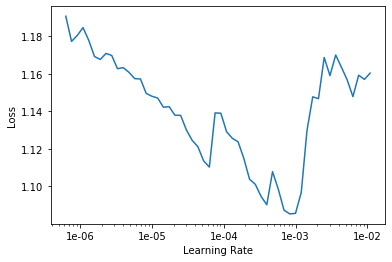

In [28]:
learn.recorder.plot()

In [29]:
lr=3e-3

In [23]:
from fastai.callbacks import *

# small change to SaveModelCallback() to add printouts
@dataclass
class SaveModelCallbackVerbose(TrackerCallback):
    "A `TrackerCallback` that saves the model when monitored quantity is best."
    every:str='improvement'
    name:str='bestmodel'
    def __post_init__(self):
        if self.every not in ['improvement', 'epoch']:
            warn(f'SaveModel every {self.every} is invalid, falling back to "improvement".')
            self.every = 'improvement'
        super().__post_init__()

    def on_epoch_end(self, epoch, **kwargs:Any)->None:
        if self.every=="epoch": self.learn.save(f'{self.name}_{epoch}')
        else: #every="improvement"
            current = self.get_monitor_value()
            if current is not None and self.operator(current, self.best):
                self.best = current
                self.learn.save(f'{self.name}')
                print(f'saved model at epoch {epoch} with {self.monitor} value: {current}')

    def on_train_end(self, **kwargs):
        if self.every=="improvement": self.learn.load(f'{self.name}')

In [31]:
learn.fit_one_cycle(40, max_lr=lr, callbacks=[SaveModelCallback(learn,
                                                 monitor='dice',
                                                 mode='max',
                                                 name='t1')])

epoch,train_loss,valid_loss,dice_loss,accuracy_thresh,dice,time
0,0.416305,0.341210,0.164875,0.933610,0.854778,07:12
1,0.394931,0.332574,0.156679,0.933353,0.857096,09:28
2,0.312609,0.229489,0.111146,0.956283,0.888368,10:14
3,0.332497,0.276868,0.128672,0.954907,0.874932,10:21
4,0.300372,0.252465,0.111180,0.957772,0.876482,09:22
5,0.287236,0.226426,0.106782,0.957623,0.896353,08:28
6,0.305306,0.245567,0.121282,0.949929,0.882000,09:55
7,0.319097,0.303543,0.157136,0.932512,0.863978,08:39
8,0.268999,0.229166,0.106602,0.957375,0.893177,09:24
9,0.328122,0.250537,0.111172,0.954826,0.889740,09:10


Better model found at epoch 0 with dice value: 0.8547776937484741.
Better model found at epoch 1 with dice value: 0.8570958375930786.
Better model found at epoch 2 with dice value: 0.8883683085441589.
Better model found at epoch 5 with dice value: 0.8963533639907837.
Better model found at epoch 13 with dice value: 0.8978462219238281.
Better model found at epoch 21 with dice value: 0.9065890908241272.
Better model found at epoch 26 with dice value: 0.9078413844108582.
Better model found at epoch 27 with dice value: 0.9095184803009033.
Better model found at epoch 35 with dice value: 0.9097827076911926.
Better model found at epoch 36 with dice value: 0.9102760553359985.
Better model found at epoch 38 with dice value: 0.9105790853500366.
Better model found at epoch 39 with dice value: 0.9107323884963989.


In [24]:
learn.load('t1')
learn.model.train();

In [25]:
learn.unfreeze()
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


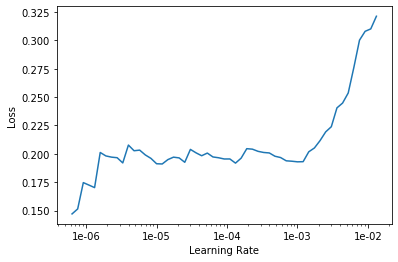

In [26]:
learn.recorder.plot()

In [27]:
lr = 1e-5

In [28]:
learn.fit_one_cycle(10, max_lr=slice(1e-6,lr/10))

epoch,train_loss,valid_loss,dice_loss,accuracy_thresh,dice,time
0,0.156274,0.139313,0.071449,0.972091,0.928927,07:47
1,0.171145,0.137524,0.070498,0.972603,0.929540,07:57
2,0.155896,0.139195,0.071473,0.972014,0.928869,08:36
3,0.163905,0.137730,0.070742,0.972556,0.929419,08:59
4,0.156798,0.139886,0.071814,0.972124,0.928423,08:02
5,0.165547,0.139189,0.071301,0.972056,0.929277,07:30
6,0.169890,0.139072,0.071220,0.972232,0.929009,07:39
7,0.155620,0.139660,0.071794,0.972029,0.928516,08:27
8,0.162876,0.139289,0.071476,0.972317,0.928603,08:20
9,0.152490,0.138932,0.071309,0.972426,0.928772,08:49


In [30]:
learn.save("stage_2")

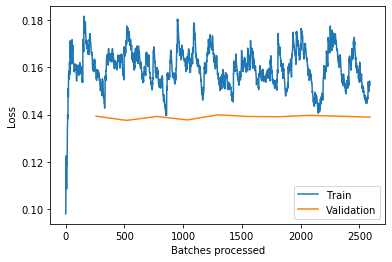

In [31]:
learn.recorder.plot_losses()

In [41]:
outputs = learn.pred_batch(ds_type=DatasetType.Valid)

In [42]:
outputs.shape

torch.Size([8, 2, 256, 256])

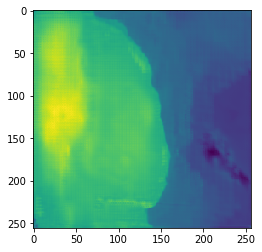

In [43]:
plt.imshow((outputs[2][1]).numpy())

In [44]:
outputs[1].shape

torch.Size([2, 256, 256])

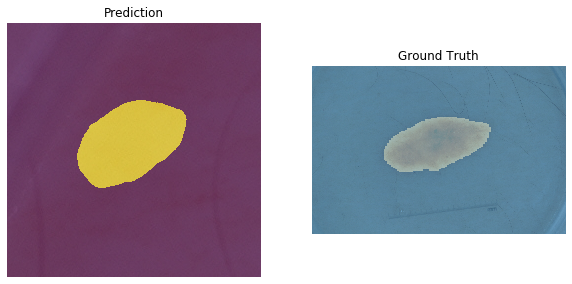

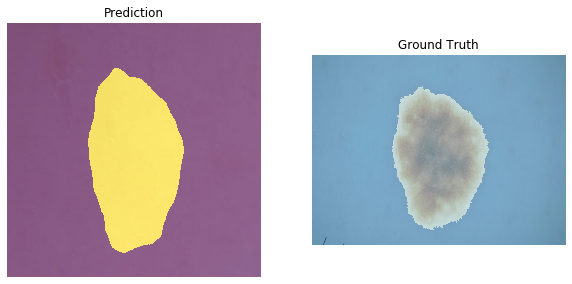

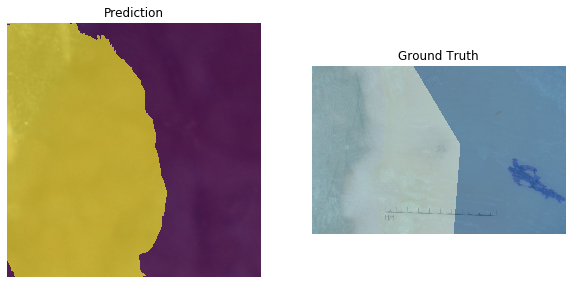

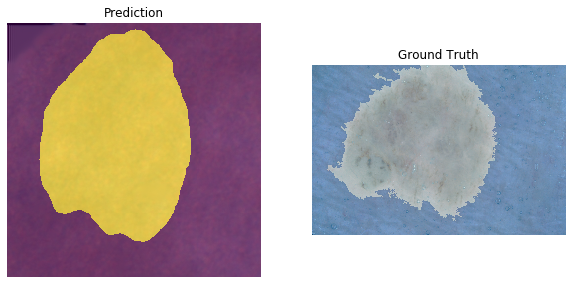

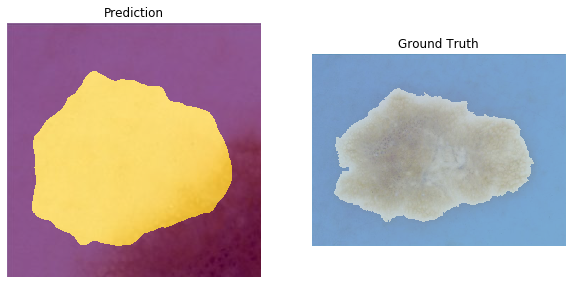

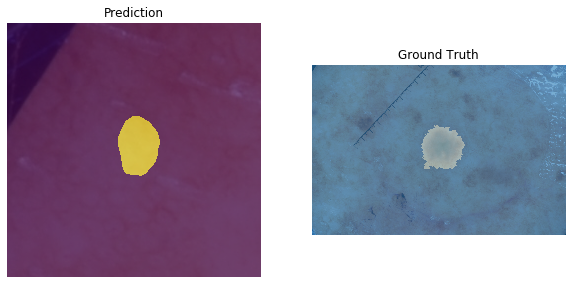

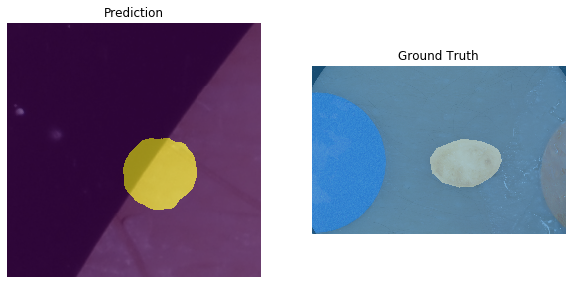

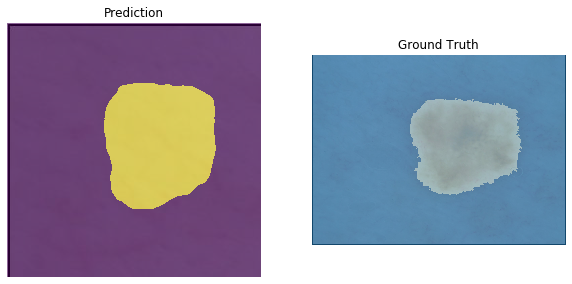

In [45]:
for i in range(8):

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,5))

    data.valid_ds.x[i].show(ax=ax1)
    ax1.set_title('Prediction')
    ax1.imshow((to_np(outputs[i][1].sigmoid()>0.95)), alpha=0.6)
    
    ax2.set_title('Ground Truth')
    data.valid_ds.x[i].show(ax=ax2)
    data.valid_ds.y[i].show(ax=ax2, alpha=0.6)
    plt.show()

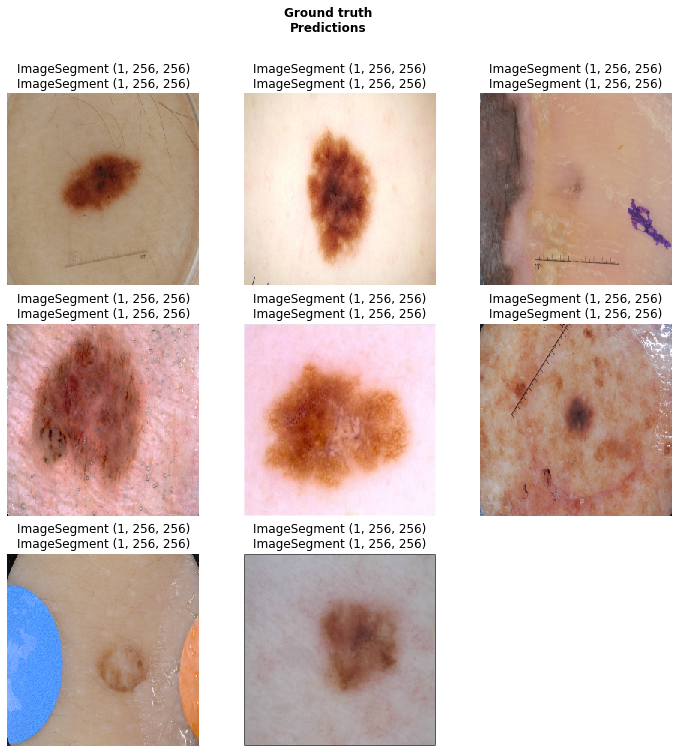

In [46]:
learn.show_results()

In [24]:
learn.load("stage_2");

In [25]:
pred,true = learn.get_preds(ds_type=DatasetType.Valid)

In [26]:
y_pred=pred
y_true=true

In [27]:
y_pred.shape, y_true.shape

(torch.Size([518, 2, 256, 256]), torch.Size([518, 1, 256, 256]))

In [28]:
y_pred = y_pred.argmax(dim=1)

In [29]:
y_pred.shape, y_true.shape

(torch.Size([518, 256, 256]), torch.Size([518, 1, 256, 256]))

In [30]:
y_true = y_true.squeeze(1)

In [31]:
y_pred.shape, y_true.shape

(torch.Size([518, 256, 256]), torch.Size([518, 256, 256]))

In [32]:
y_t = y_true
y_p = y_pred

In [33]:
y_t.shape, y_p.shape

(torch.Size([518, 256, 256]), torch.Size([518, 256, 256]))

In [34]:
y_t.type, y_p.type

(<function Tensor.type>, <function Tensor.type>)

In [35]:
y_t = y_t.numpy()
y_p = y_p.numpy()

In [36]:
y_t =y_t.flatten()
y_p =y_p.flatten()

In [37]:
y_t.shape, y_p.shape

((33947648,), (33947648,))

Convert pytorch array to tensorflow tensor using Keras

In [38]:
import tensorflow.keras.backend as K
import numpy as np

a_tr = np.array(y_t)
tr = K.constant(a_tr)
c_pr = np.array(y_p)
pr = K.constant(c_pr)


In [39]:
print(tr)

# <tf.Tensor 'Const_1:0' shape=(3,) dtype=float32>
print(K.eval(tr))

tf.Tensor([0. 0. 0. 0. ... 0. 0. 0. 0.], shape=(33947648,), dtype=float32)
[0. 0. 0. 0. ... 0. 0. 0. 0.]


In [40]:
print(pr)

# <tf.Tensor 'Const_1:0' shape=(3,) dtype=float32>
print(K.eval(pr))

tf.Tensor([0. 0. 0. 0. ... 0. 0. 0. 0.], shape=(33947648,), dtype=float32)
[0. 0. 0. 0. ... 0. 0. 0. 0.]


In [41]:
from keras import backend as K

def binary_pixelwise_accuracy(y_true, y_pred):
    true_pos = K.sum(K.abs(y_true * y_pred), axis=0)
    true_neg = K.sum(K.abs((1. - y_true) * (1. - y_pred)), axis=0)
    total_pos = K.sum(K.abs(y_pred), axis=0)
    total_neg = K.sum(K.abs(1. - y_true), axis=0)
    return (true_pos + true_neg) / K.clip((total_pos +total_neg), K.epsilon(), None)



def binary_pixelwise_precision(y_true, y_pred):
    true_pos = K.sum(K.abs(y_true * y_pred), axis=0)
    total_pos = K.sum(K.abs(y_pred), axis=0)
    return true_pos / K.clip(total_pos, K.epsilon(), None)

def categorical_pixelwise_precision(y_true, y_pred):
    true_pos = K.sum(K.abs(y_true * y_pred), axis=[1, 2])
    total_pos = K.sum(K.abs(y_pred), axis=[1, 2])
    return true_pos / K.clip(total_pos, K.epsilon(), None)



def pixelwise_recall(num_classes=1):
    return pixelwise_sensitivity(num_classes)



def binary_pixelwise_sensitivity(y_true, y_pred):
    """
    true positive rate, probability of detection

    sensitivity = # of true positives / (# of true positives + # of false negatives)

    Reference: https://en.wikipedia.org/wiki/Sensitivity_and_specificity
    :param y_true:
    :param y_pred:
    :return:
    """
    # indices = tf.where(K.greater_equal(y_true, 0.5))
    # y_pred = tf.gather_nd(y_pred, indices)

    y_true = K.round(y_true)
    true_pos = K.sum(K.abs(y_true * y_pred), axis=0)
    total_pos = K.sum(K.abs(y_true), axis=0)
    return true_pos / K.clip(total_pos, K.epsilon(), None)

def categorical_pixelwise_sensitivity(y_true, y_pred):
    true_pos = K.sum(K.abs(y_true * y_pred), axis=[1, 2])
    total_pos = K.sum(K.abs(y_true), axis=[1, 2])
    return K.mean(true_pos / K.clip(total_pos, K.epsilon(), None), axis=-1)

   


def pixelwise_specificity(num_classes=1):
    """
    true negative rate
    the proportion of negatives that are correctly identified as such

    specificity = # of true negatives / (# of true negatives + # of false positives)

    :param y_true:  ground truth
    :param y_pred: prediction
    :return:
    """

def binary_pixelwise_specificity(y_true, y_pred):
    true_neg = K.sum(K.abs((1. - y_true) * (1. - y_pred)), axis=0)
    total_neg = K.sum(K.abs(1. - y_true), axis=0)
    return true_neg / K.clip(total_neg, K.epsilon(), None)

def categorical_pixelwise_specificity(y_true, y_pred):
    y_true, y_pred = y_true[..., 1:], y_pred[..., 1:]
    true_neg = K.sum(K.abs((1. - y_true) * (1. - y_pred)), axis=[1, 2])
    total_neg = K.sum(K.abs(1. - y_true), axis=[1, 2])
    return true_neg / K.clip(total_neg, K.epsilon(), None)




def binary_dice_coeff(y_true, y_pred):
    """
            DSC = (2 * |X & Y|)/ (|X|+ |Y|)
                = 2 * sum(|A*B|)/(sum(|A|)+sum(|B|))
    :param y_true: ground truth
    :param y_pred: prediction
    :return:
    """

    intersection = K.sum(K.abs(y_true * y_pred), axis=0)
    union = K.sum(K.abs(y_true) + K.abs(y_pred), axis=0)
    dice = 2 * intersection / K.clip(union, K.epsilon(), None)
    return dice

def categorical_dice_coeff(y_true, y_pred):

    intersection = K.sum(K.abs(y_true * y_pred), axis=[1, 2])
    union = K.sum(K.abs(y_true) + K.abs(y_pred), axis=[1, 2])
    dice = 2 * intersection / K.clip(union, K.epsilon(), None)
    return K.mean(dice, axis=-1)

   


def class_jaccard_index(idx):
    def jaccard_index(y_true, y_pred):
        y_true, y_pred = y_true[..., idx], y_pred[..., idx]
        y_true = K.round(y_true)
        y_pred = K.round(y_pred)
        # Adding all three axis to average across images before dividing
        # See https://forum.isic-archive.com/t/task-2-evaluation-and-superpixel-generation/417/2
        intersection = K.sum(K.abs(y_true * y_pred), axis=0)
        sum_ = K.sum(K.abs(y_true) + K.abs(y_pred), axis=0)
        jac = intersection / K.clip(sum_ - intersection, K.epsilon(), None)
        return jac
    return jaccard_index



"""
Jaccard index for semantic segmentation, also known as the intersection-over-union.

    This loss is useful when you have unbalanced numbers of pixels within an image
    because it gives all classes equal weight. However, it is not the defacto
    standard for image segmentation.

    For example, assume you are trying to predict if each pixel is cat, dog, or background.
    You have 80% background pixels, 10% dog, and 10% cat. If the model predicts 100% background
    should it be be 80% right (as with categorical cross entropy) or 30% (with this loss)?

    The loss has been modified to have a smooth gradient as it converges on zero.
    This has been shifted so it converges on 0 and is smoothed to avoid exploding
    or disappearing gradient.

    Jaccard = (|X & Y|)/ (|X|+ |Y| - |X & Y|)
            = sum(|A*B|)/(sum(|A|)+sum(|B|)-sum(|A*B|))

    # References

    Csurka, Gabriela & Larlus, Diane & Perronnin, Florent. (2013).
    What is a good evaluation measure for semantic segmentation?.
    IEEE Trans. Pattern Anal. Mach. Intell.. 26. . 10.5244/C.27.32.

    https://en.wikipedia.org/wiki/Jaccard_index

    """

def binary_jaccard_index(y_true, y_pred):
    y_true = K.round(y_true)
    y_pred = K.round(y_pred)
    intersection = K.sum(K.abs(y_true * y_pred), axis=0)
    union = K.sum(K.abs(y_true) + K.abs(y_pred), axis=0)
    iou = intersection / K.clip(union - intersection, K.epsilon(), None)
    return iou

def categorical_jaccard_index(y_true, y_pred):
    y_true = K.round(y_true)
    y_pred = K.round(y_pred)
    intersection = K.abs(y_true * y_pred)
    union = K.abs(y_true) + K.abs(y_pred)

    intersection = K.sum(intersection, axis=[0, 1, 2])
    union = K.sum(union, axis=[0, 1, 2])

    iou = intersection / K.clip(union - intersection, K.epsilon(), None)
    # iou = K.mean(iou, axis=-1)
    return iou



Using TensorFlow backend.


In [42]:
print(binary_pixelwise_accuracy(tr, pr))

tf.Tensor(0.97869277, shape=(), dtype=float32)


In [43]:
print(binary_pixelwise_precision(tr, pr))

tf.Tensor(0.9502519, shape=(), dtype=float32)


In [49]:
print(binary_pixelwise_sensitivity(tr, pr))

tf.Tensor(0.9187136, shape=(), dtype=float32)


In [45]:
print(binary_pixelwise_specificity(tr, pr))

tf.Tensor(0.9864431, shape=(), dtype=float32)


In [46]:
print(binary_dice_coeff(tr, pr))

tf.Tensor(0.9342167, shape=(), dtype=float32)


In [47]:
print(binary_jaccard_index(tr, pr))

tf.Tensor(0.876554, shape=(), dtype=float32)
